# AIS analysis
This notebook provides codes for analyzing AIS datasets for Chinese fishing in North Korean waters. The figures and numbers here are used in the paper "Illuminating Dark Fishing Fleets in North Korea" published in Science Advances on July 22, 2020. All the datasets are publicly available in the BigQuery bucket named `global-fishing-watch.paper_dark_fishing_fleets_in_north_korea`.

Last updated: July 1, 2020

Developed by Global Fishing Watch Inc.

In [1]:
#
# Import libraries
#
import pandas as pd
import numpy as np

import calendar
import datetime
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('bmh')
from mpl_toolkits.basemap import Basemap
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore",category=mpl.cbook.mplDeprecation)

In [2]:
#
# Pull detection boundaries
#
_eez_prk_wo_mz = '../../../data-analysis/chinese_squidfleet_in_nkorea/boundary/eez_prk_wo_mz/eez_prk_wo_mz'
_eez_prk_mz = '../../../data-analysis/chinese_squidfleet_in_nkorea/boundary/eez_prk_mz/eez_prk_mz'
_study_area = '../../../data-analysis/chinese_squidfleet_in_nkorea/boundary/study_area/study_area'
_eez_prk_no_shoreline = '../../../data-analysis/chinese_squidfleet_in_nkorea/boundary/eez_prk/eez_prk_no_shoreline'

# MMSIs for fishing, non-fishing vessels appeared in North Korea
The datasets are available at Global Fishing Watch's public data BigQuery bucket under `global-fishing-watch`. 
`paper_dark_fishing_fleets_in_north_korea.ais_chinese_fishing_vessels_2017`
`paper_dark_fishing_fleets_in_north_korea.ais_chinese_fishing_vessels_2018`
`paper_dark_fishing_fleets_in_north_korea.ais_non_chinese_fishing_vessels_2017`
`paper_dark_fishing_fleets_in_north_korea.ais_non_chinese_fishing_vessels_2018`
`paper_dark_fishing_fleets_in_north_korea.ais_non_fishing_vessels_2017`
`paper_dark_fishing_fleets_in_north_korea.ais_non_fishing_vessels_2018`

In [77]:
#
# Classified as fishing vessels with Chinese or invalid MMSIs
#
q = """
# StandardSQL
SELECT *
FROM `paper_dark_fishing_fleets_in_north_korea.ais_chinese_fishing_vessels_2017`
"""
chn_mmsis_2017 = pd.read_gbq(q, project_id='global-fishing-watch', dialect='standard')

q = """
# StandardSQL
SELECT *
FROM `paper_dark_fishing_fleets_in_north_korea.ais_chinese_fishing_vessels_2018`
"""
chn_mmsis_2018 = pd.read_gbq(q, project_id='global-fishing-watch', dialect='standard')

#
# Classified as fishing vessels with non-Chinese MMSIs
#
q = """
# StandardSQL
SELECT *
FROM `paper_dark_fishing_fleets_in_north_korea.ais_non_chinese_fishing_vessels_2017`
"""
non_chn_mmsis_2017 = pd.read_gbq(q, project_id='global-fishing-watch', dialect='standard')

q = """
# StandardSQL
SELECT *
FROM `paper_dark_fishing_fleets_in_north_korea.ais_non_chinese_fishing_vessels_2018`
"""
non_chn_mmsis_2018 = pd.read_gbq(q, project_id='global-fishing-watch', dialect='standard')

#
# Classified as non-fishing vessels
#
q = """
# StandardSQL
SELECT *
FROM `paper_dark_fishing_fleets_in_north_korea.ais_non_fishing_vessels_2017`
"""
non_fishing_mmsis_2017 = pd.read_gbq(q, project_id='global-fishing-watch', dialect='standard')

q = """
# StandardSQL
SELECT *
FROM `paper_dark_fishing_fleets_in_north_korea.ais_non_fishing_vessels_2018`
"""
non_fishing_mmsis_2018 = pd.read_gbq(q, project_id='global-fishing-watch', dialect='standard')

## Number of vessels

In [78]:
#
# Number of vessels 2017-2018 (Chinese fishing, non-Chinese fishing, and non-fishing) 
#
print(len(chn_mmsis_2017), len(chn_mmsis_2018), 
      len(non_chn_mmsis_2017), len(non_chn_mmsis_2018),
      len(non_fishing_mmsis_2017), len(non_fishing_mmsis_2018))

179 226 31 48 1075 1537


In [79]:
#
# All likely Chinese fishing vessels 2017-2018 by flag state 
# including those non-Chinese flagged vessels that behave 
# in the same way as Chinese flagged vessels
#
temp = pd.concat([chn_mmsis_2017,
                  chn_mmsis_2018])
temp = temp.drop_duplicates('mmsi')
temp['iso3'].value_counts()

CHN    174
GUF      2
THA      2
CYP      1
URY      1
GEO      1
LKA      1
AZE      1
Name: iso3, dtype: int64

In [80]:
#
# All non-Chinese fishing vessels 2017-2018 by flag state (except invalid MMSI codes)
#
temp = pd.concat([non_chn_mmsis_2017,
                  non_chn_mmsis_2018])
temp = temp.drop_duplicates('mmsi')
temp.iso3.value_counts()

RUS    59
BLZ     3
KOR     2
Name: iso3, dtype: int64

In [81]:
#
# All non-fishing vessels 2017-2018 by flag state
#
non_fishing = pd.concat([non_fishing_mmsis_2017, 
                         non_fishing_mmsis_2018]).drop_duplicates('mmsi')
print(len(non_fishing))
non_fishing['iso3'].value_counts().head()

2215


PAN    503
RUS    265
HKG    228
LBR    185
MHL    172
Name: iso3, dtype: int64

# Map of AIS Positions

In [94]:
#
# Create a map of all AIS positions
#
import calendar
def yearly_positions_composite(data, year, title='', zoomout=False, non_fishing=False):
    
    if zoomout==False:
        ## default map setting
        llcrnrlon = 127
        urcrnrlon = 137
        llcrnrlat = 36
        urcrnrlat = 44
        
        ## set longitude, latitude ticks on x- and y-axes
        gap_lat = 3
        gap_lon = 4
        med_lat = 40.0
        med_lon = 132.0
        num_tick_lat = 3
        num_tick_lon = 3
    else:
        coords=[107.5,1,160.5,47] #[107,20,137,44] #[107,10,165,54]
        llcrnrlon = coords[0]
        llcrnrlat = coords[1]
        urcrnrlon = coords[2]
        urcrnrlat = coords[3]
        
        ## set longitude, latitude ticks on x- and y-axes
        gap_lat = 18
        gap_lon = 21
        med_lat = 24.0
        med_lon = 134.0
        num_tick_lat = 3
        num_tick_lon = 3
        
    q="""#standardSQL
    SELECT
      ssvid, lat, lon, timestamp, fishing
    FROM
      `global-fishing-watch.paper_dark_fishing_fleets_in_north_korea.ais_positions_{year}` 
    WHERE 
      timestamp >= '{year}-01-01'
      AND timestamp < '{year_next}-01-01'
      AND lat BETWEEN {llcrnrlat} AND {urcrnrlat}
      AND lon BETWEEN {llcrnrlon} AND {urcrnrlon}
      AND ssvid IN {mmsis}""".format(year=year, year_next=year+1, 
                                     mmsis=tuple([str(e) for e in list(data['mmsi'].values)]),
                                     llcrnrlat=llcrnrlat, urcrnrlat=urcrnrlat,
                                     llcrnrlon=llcrnrlon, urcrnrlon=urcrnrlon)
    df = pd.read_gbq(q, project_id='global-fishing-watch', verbose=False, dialect='standard')
    if (len(df)==0):
        print('No data...')
        return np.nan
   
    fig = plt.figure(figsize=(8,8), dpi=300)
    fig.text(0.08, 0.89, title, fontsize=22, ha='left')

    #
    # default Basemap setting
    ax = fig.add_subplot(111)
    m = Basemap(llcrnrlon=llcrnrlon, llcrnrlat=llcrnrlat, 
                urcrnrlon=urcrnrlon, urcrnrlat=urcrnrlat,
                lat_ts=0, projection='mill',resolution="l")
    m.drawmapboundary(fill_color='white', color='white', zorder=0.5) 
    m.fillcontinents(color='#E5E5E5', lake_color='#E5E5E5', zorder=1) 
    m.drawcountries(color='white', linewidth=1.5)
    
    m.drawparallels(np.arange(med_lat-gap_lat, med_lat+gap_lat+1, gap_lat),
                    labels=[1,0,0,0], linewidth=0.01, zorder=0)
    m.drawmeridians(np.arange(med_lon-gap_lon, med_lon+gap_lon+1, gap_lon),
                    labels=[0,0,0,1], linewidth=0.01, zorder=0)

    
    #
    # Read boundary shapefiles
    if not non_fishing:
        z = 1.5
        lw = 1.5
    else:
        z = 2.5
        lw = 2
    m.readshapefile(_study_area,'sa', zorder=z, linewidth=lw, color='#E5E5E5')
    prk = m.readshapefile(_eez_prk_no_shoreline, 'prk', zorder=z, 
                          linewidth=lw, color='#E5E5E5')
    prk[-1].set_linestyle('--')
    m.plot([], [], linewidth=1.5, alpha=0.8, 
           color='#CCCCCC', label='Study area')
    m.plot([], [], linewidth=1.5, linestyle='--', alpha=0.8, 
           color='#CCCCCC', label='EEZ claimed by N.Korea')
 
    #
    # Plot all AIS positions
    df_f = df[df['fishing']]
    df_nf = df[df['fishing']==False]
    lon_f, lat_f = m(df_f['lon'].values, df_f['lat'].values)
    lon_nf, lat_nf = m(df_nf['lon'].values, df_nf['lat'].values)
    
    if zoomout:
        s=2
        alpha=0.05
        markerscale=4
    else:
        s=8
        alpha=0.15
        markerscale=2
    m.scatter(lon_nf, lat_nf, c='#2A186C', s=s, alpha=alpha,
              edgecolors='face', zorder=2, label='Non-fishing position')
    m.scatter(lon_f, lat_f, c='#ca0020', s=s, alpha=alpha,
              edgecolors='face', zorder=2, label='Fishing position')
    
    handles, labels = plt.gca().get_legend_handles_labels()
    order = [3,2,0,1]
    
    leg = plt.legend([handles[idx] for idx in order],[labels[idx] for idx in order], loc=4, bbox_to_anchor=(1.0,0.0), # 
                       frameon=True, markerscale=markerscale, fontsize=10) #, prop=rbt_reg

    for text in leg.get_texts():
        text.set_color("black")
        text.set_fontsize(14)
    for lh in leg.legendHandles: 
        lh.set_alpha(1)
    frame = leg.get_frame()
    frame.set_facecolor('white')
    frame.set_edgecolor('#e5e5e5')
    frame.set_linewidth(1.5)
    frame.set_alpha(0.9)

    #
    # axes, figures, labels, title
    ax = plt.gca()
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
        
    fig.tight_layout()
    plt.show()

## Fig. S13 - AIS positions of likely Chinese fishing vessels

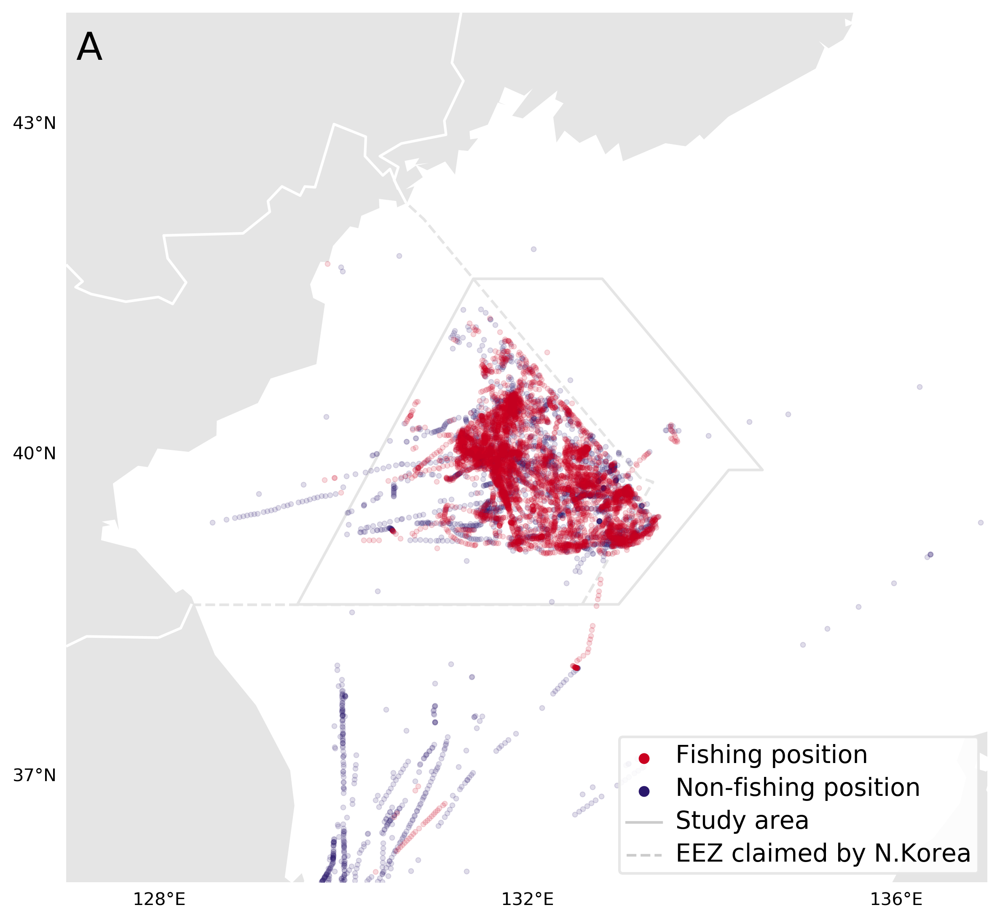

In [95]:
yearly_positions_composite(chn_mmsis_2017, 2017, 'A')

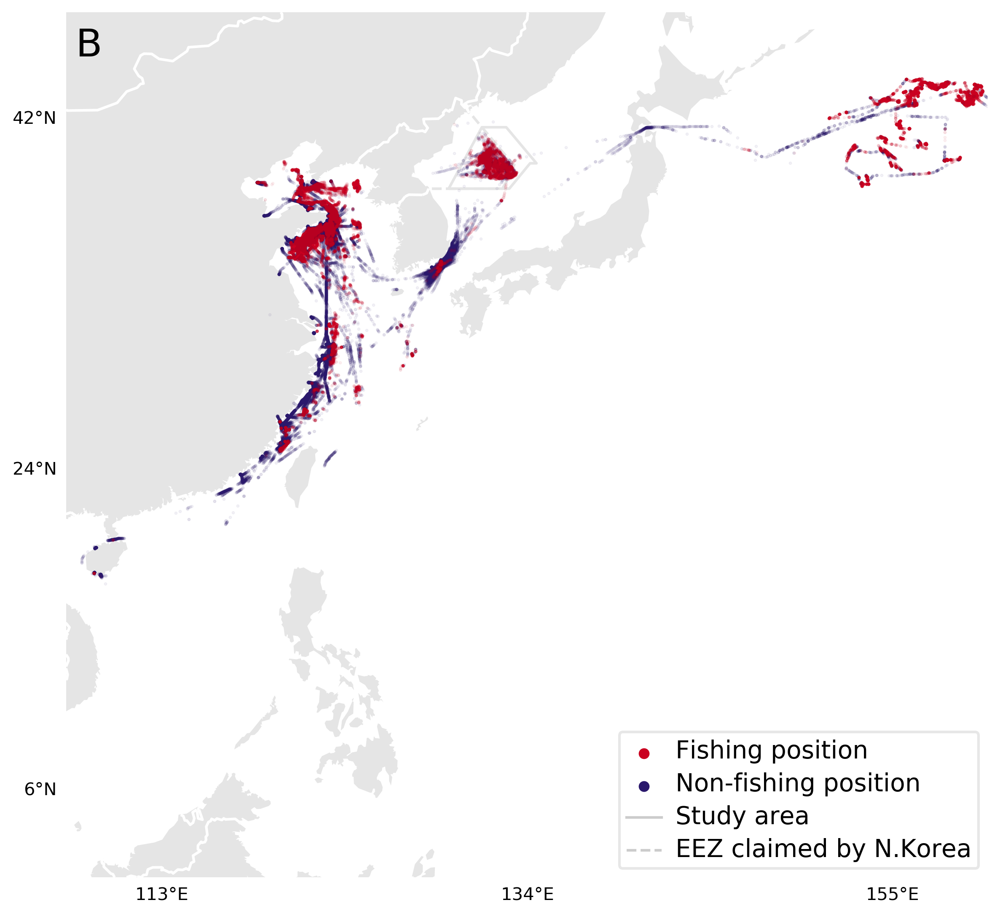

In [96]:
yearly_positions_composite(chn_mmsis_2017, 2017, 'B', zoomout=True)

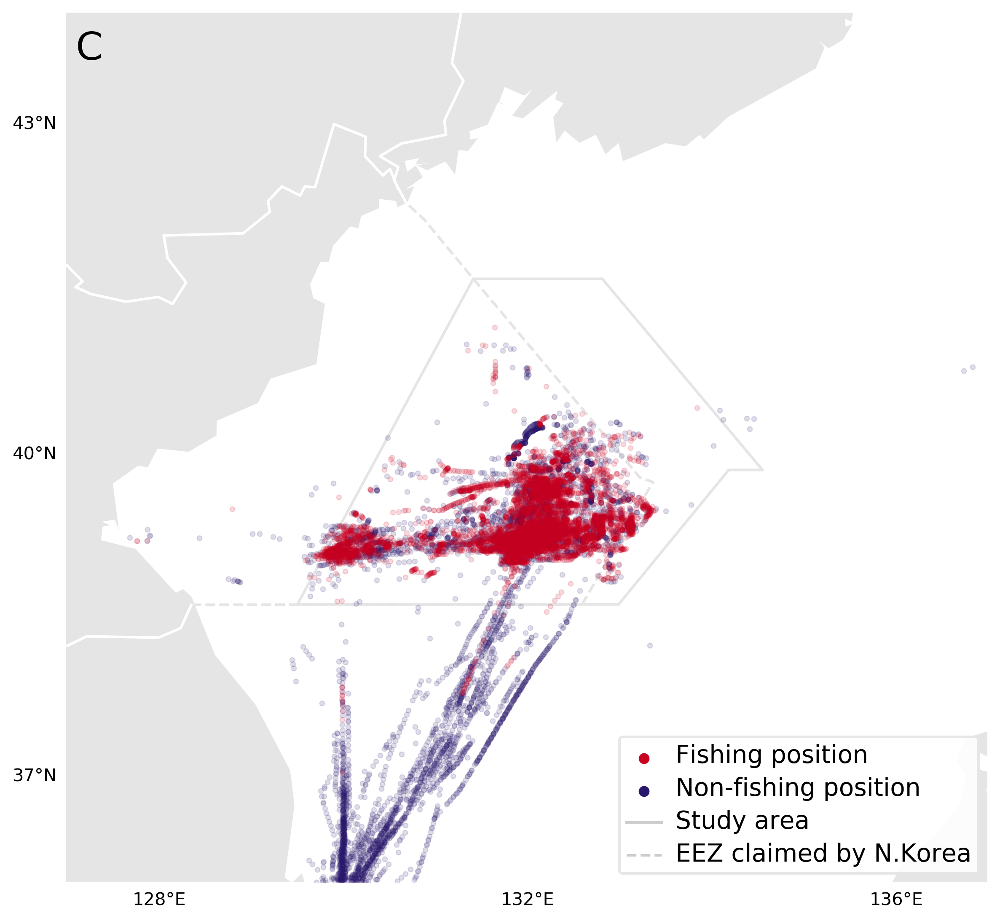

In [97]:
yearly_positions_composite(chn_mmsis_2018, 2018, 'C')

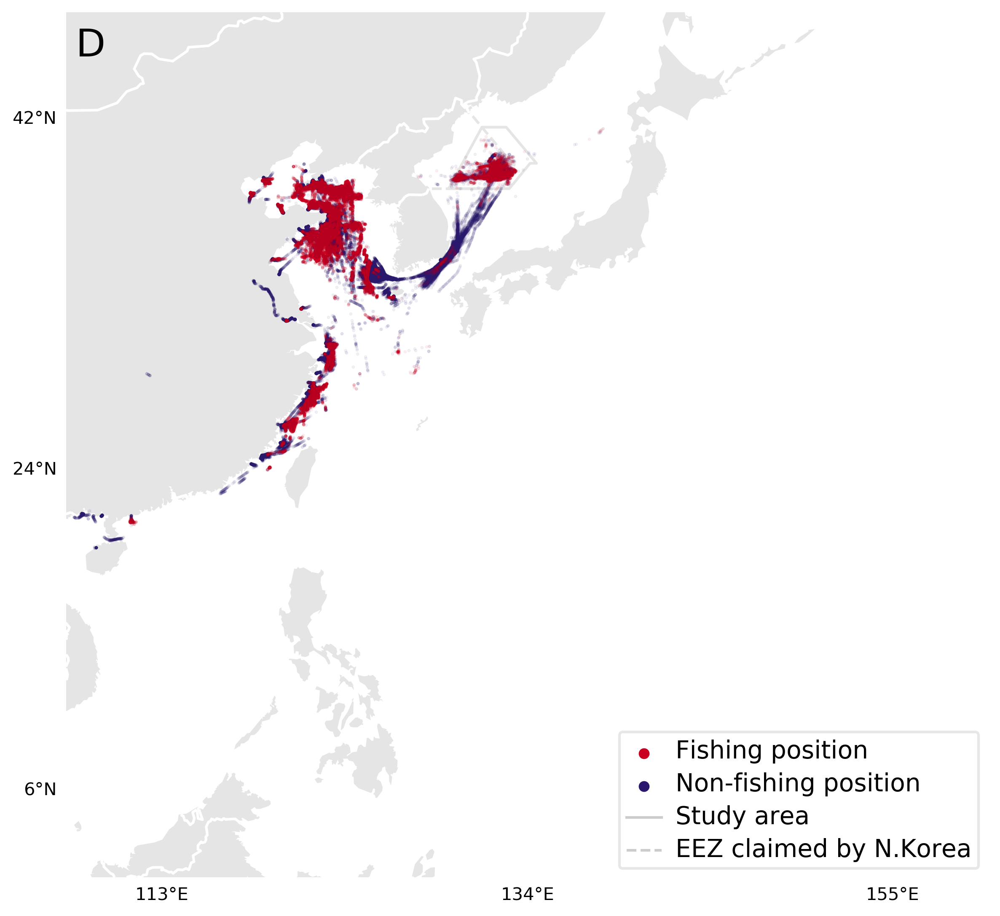

In [98]:
yearly_positions_composite(chn_mmsis_2018, 2018, 'D', zoomout=True)

## Fig. S14 - AIS positions of vessels that are likely not Chinese fishing vessels

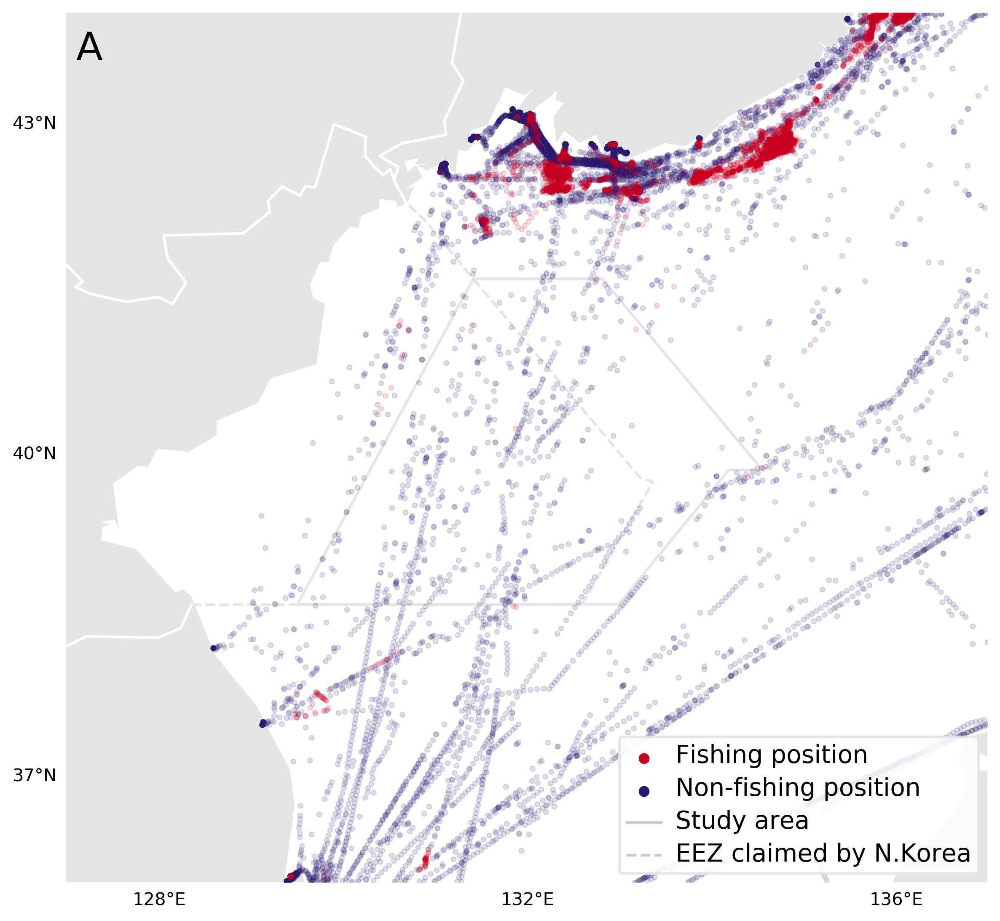

In [99]:
yearly_positions_composite(non_chn_mmsis_2017, 2017, 'A', zoomout=False)

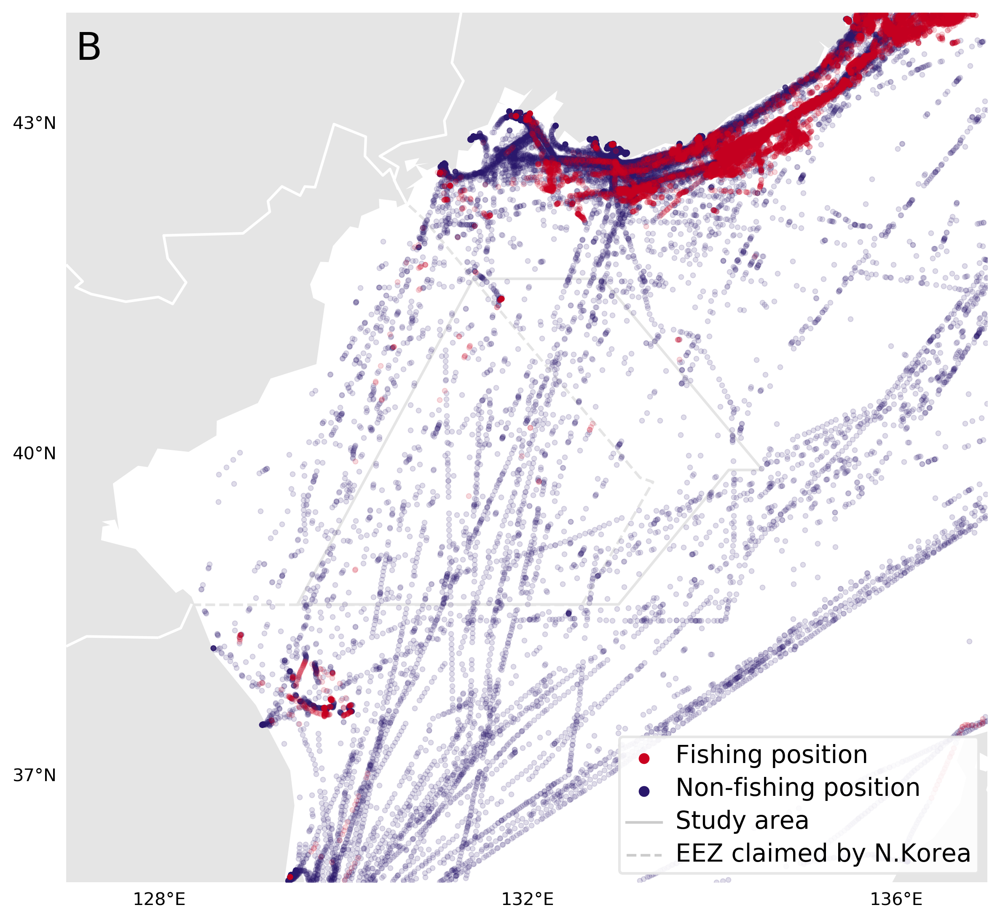

In [100]:
yearly_positions_composite(non_chn_mmsis_2018, 2018, 'B', zoomout=False)

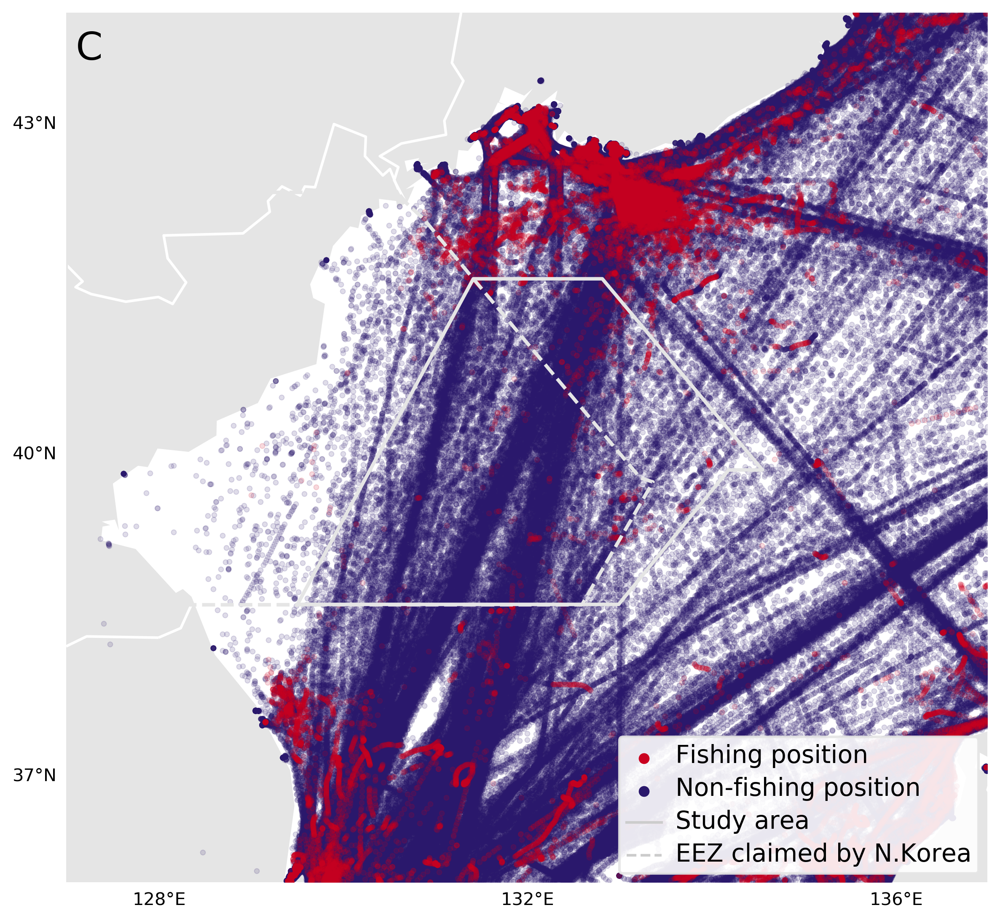

In [101]:
yearly_positions_composite(non_fishing_mmsis_2017, 2017, 'C', zoomout=False, non_fishing=True)

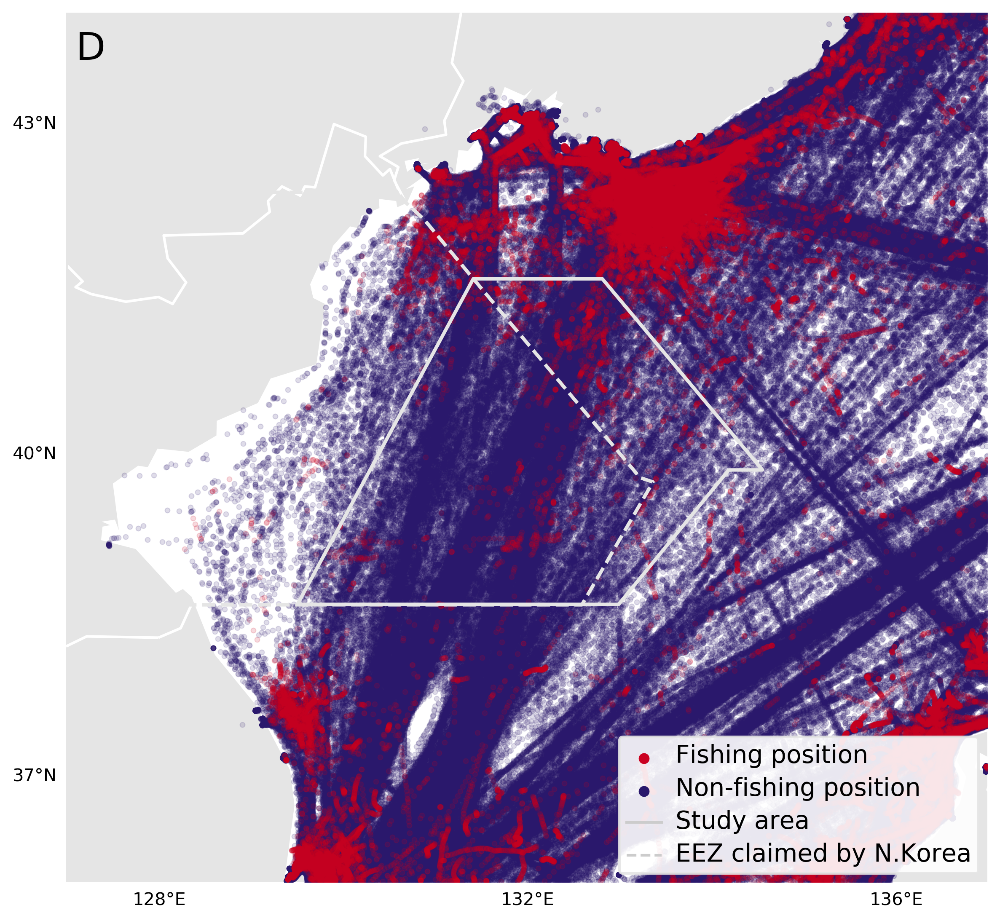

In [102]:
yearly_positions_composite(non_fishing_mmsis_2018, 2018, 'D', zoomout=False, non_fishing=True)

# Figure 2 - Origin of vessels fishing in North Korean waters

In [103]:
#
# Create all AIS positions of likely Chinese fishing vessels 2017-2018
#
import calendar
def all_position_composite(data):
    
    #
    # default map setting
    coords=[107,20,137,44] 
    llcrnrlon = coords[0]
    llcrnrlat = coords[1]
    urcrnrlon = coords[2]
    urcrnrlat = coords[3]

    #
    # set longitude, latitude ticks on x- and y-axes
    gap_lat = 10 
    gap_lon = 12 
    med_lat = 32 
    med_lon = 122 
    num_tick_lat = 3
    num_tick_lon = 3
        
    #
    # Pull AIS positions of likely Chinese fishing vessels that fished in N.Korea
    q = """
    # StandardSQL
    SELECT
      ssvid, lat, lon, timestamp, fishing
    FROM
      `global-fishing-watch.paper_dark_fishing_fleets_in_north_korea.ais_positions_*` 
    WHERE 
      timestamp BETWEEN TIMESTAMP('2017-01-01') AND TIMESTAMP('2019-01-01')
      AND lat BETWEEN {llcrnrlat} AND {urcrnrlat}
      AND lon BETWEEN {llcrnrlon} AND {urcrnrlon}
      AND ssvid IN {mmsis}
    """.format(mmsis=tuple([str(e) for e in list(data['mmsi'].values)]),
               llcrnrlat=llcrnrlat, urcrnrlat=urcrnrlat,
               llcrnrlon=llcrnrlon, urcrnrlon=urcrnrlon)
    df = pd.read_gbq(q, project_id='global-fishing-watch', dialect='standard')
    if (len(df)==0):
        print('No data...')
        return np.nan
   
    fig = plt.figure(figsize=(4.5,4.5), dpi=300)

    #
    # default Basemap setting
    ax = fig.add_subplot(111)
    m = Basemap(llcrnrlon=llcrnrlon, llcrnrlat=llcrnrlat,
                urcrnrlon=urcrnrlon, urcrnrlat=urcrnrlat,
                lat_ts=0, projection='mill',resolution="l")
    m.drawmapboundary(fill_color='white', color='#cccccc')
    m.fillcontinents(color='#cccccc', lake_color='white', zorder=1) 
    m.drawcountries(color='white', linewidth=1.0)
    
    #
    # Read boundary shapefiles
    m.readshapefile(_study_area, 'sa', zorder=1.5, linewidth=1., color='#b2b2b2')
    prk = m.readshapefile(_eez_prk_no_shoreline, 'prk', zorder=1., 
                          linewidth=1.0, color='#b2b2b2')
    prk[-1].set_linestyle('--')
    m.plot([], [], linewidth=1.5, alpha=0.8, 
           color='#b2b2b2', label='Study Area')
    m.plot([], [], linewidth=1.5, linestyle='--', alpha=0.8, 
           color='#b2b2b2', label='Claimed N.Korean EEZ')
    
    #
    # Scale bar
    lon, lat = np.array([107.8,112.3]), np.array([43.2,43.2])
    lon, lat = m(lon, lat)
    m.plot(lon, lat, linewidth=1.5, color='k')
    lon, lat = m(108.0, 42.2)
    plt.text(lon, lat, '500 km', color='k', fontsize=10)
    
    #
    # Plot AIS positions fishing/non-fishing
    df_f = df[df['fishing'] == True]
    df_nf = df[df['fishing'] == False]
    lon_f, lat_f = m(df_f['lon'].values, df_f['lat'].values)
    lon_nf, lat_nf = m(df_nf['lon'].values, df_nf['lat'].values)

    s=0.15
    alpha=0.02
    markerscale=8
    c='#2A186C'
    m.scatter(lon_nf, lat_nf, c=c, s=s, alpha=alpha,
              edgecolors='face', zorder=2, label='AIS Non-fishing Position') 
    m.scatter(lon_f, lat_f, c='#ca0020', s=s, alpha=alpha,
              edgecolors='face', zorder=2, label='AIS Fishing Position') #ca0020

    #
    # Legend and label handling
    handles, labels = plt.gca().get_legend_handles_labels()
    order = [3,2,0,1]
    
    leg = plt.legend([handles[idx] for idx in order],
                     [labels[idx] for idx in order], 
                     loc=4, bbox_to_anchor=(1.0,-0.0), 
                     frameon=True, markerscale=markerscale, 
                     fontsize=10, labelspacing=0.15)

    for text in leg.get_texts():
        text.set_color("black")
        text.set_fontsize(10)
    for lh in leg.legendHandles: 
        lh.set_alpha(1)
    frame = leg.get_frame()
    frame.set_facecolor('white')
    frame.set_edgecolor('#e5e5e5')
    frame.set_linewidth(1.)
    frame.set_alpha(0.7)
    
    #
    # Country names on the map
    lon, lat = m(125.3, 36)
    plt.text(lon, lat, 'S.Korea', color='#363636', fontsize=10) 
    lon, lat = m(125.3, 39.8)
    plt.text(lon, lat, 'N.Korea', color='#363636', fontsize=10)
    lon, lat = m(112, 33)
    plt.text(lon, lat, 'China', color='#363636', fontsize=10)
    lon, lat = m(131.8, 43.1)
    plt.text(lon, lat, 'Russia', color='#363636', fontsize=10)
    lon, lat = m(133, 34.5)
    plt.text(lon, lat, 'Japan', color='#363636', fontsize=10)

    xtick1,_ = m(110,0)
    xtick2,_ = m(122,0)
    xtick3,_ = m(134,0)
    _,ytick1 = m(0,22)
    _,ytick2 = m(0,32)
    _,ytick3 = m(0,42)
    
    #
    # Ticks
    ax.set_xticks([xtick1,xtick2,xtick3])
    ax.set_xticklabels(['110'+u"\u00b0"+'E',
                        '122'+u"\u00b0"+'E', 
                        '134'+u"\u00b0"+'E'])
    ax.tick_params(axis="x", direction="out", color='#b2b2b2', labelsize=10)
    ax.set_yticks([ytick1,ytick2,ytick3])
    ax.set_yticklabels(['22'+u"\u00b0"+'N', 
                        '32'+u"\u00b0"+'N', 
                        '42'+u"\u00b0"+'N'])
    ax.tick_params(axis="y", direction="out", color='#b2b2b2', labelsize=10)
    ax.grid(False)
        
    fig.tight_layout()
    plt.show()

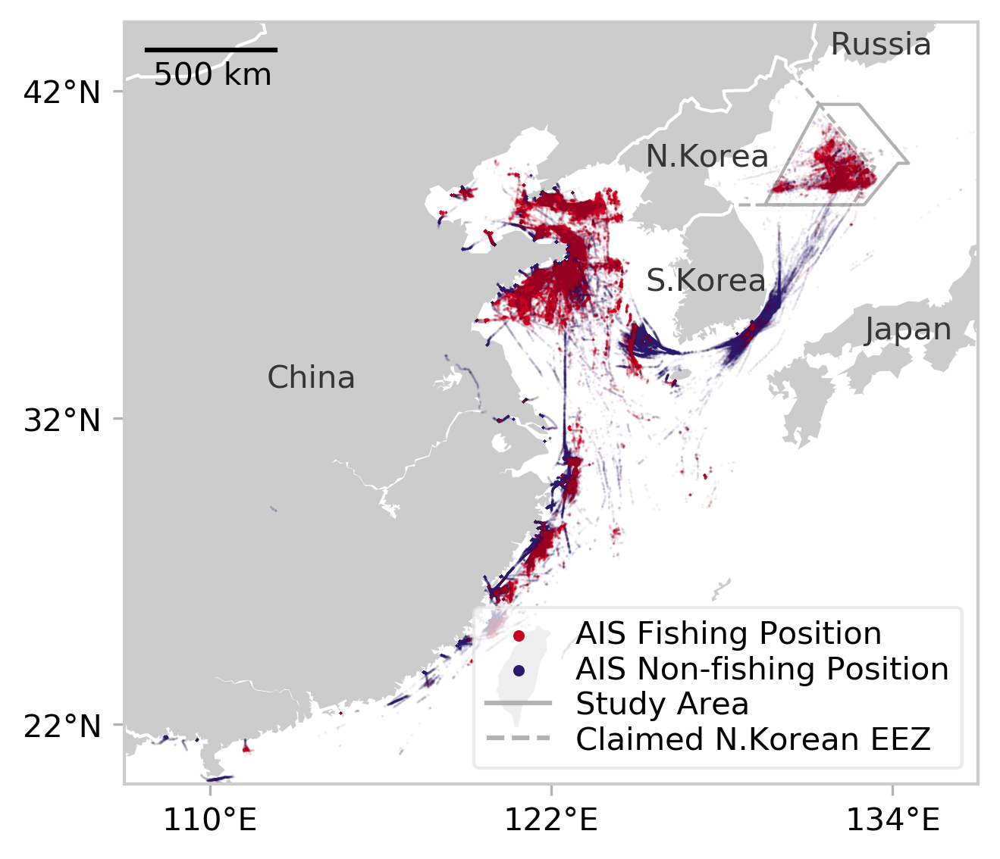

In [104]:
all_position_composite(pd.concat([chn_mmsis_2017, chn_mmsis_2018]))

## Fig. S16 - Selected individual vessel tracks

In [105]:
#
# All AIS positions of likely Chinese fishing vessels
#
q = """
# StandardSQL
SELECT SAFE_CAST(ssvid AS INT64) AS mmsi, lat, lon, timestamp
FROM `global-fishing-watch.paper_dark_fishing_fleets_in_north_korea.ais_positions_2018`
WHERE timestamp BETWEEN TIMESTAMP('2018-01-01') AND TIMESTAMP('2019-01-01')
  AND ssvid IN ("100900228", "412110002", "412442123", 
                "700057364", "800038820", "815012345")
"""
track2018 = pd.read_gbq(q, project_id='global-fishing-watch', dialect='standard') # 

In [106]:
#
# Plot individual vessel tracks to show vessels that
# enter / come out of North Korean waters multiple times each year
#
def vessel_track_individual_multi(data, date1, date2, title='AIS position track'):

    #data = data.sort_values('timestamp')
    if (len(data)==0):
        print('No data...')
        return np.nan
    
    #
    # default map setting
    llcrnrlon = 118
    urcrnrlon = 136
    llcrnrlat = 26
    urcrnrlat = 44
    
    #
    # default Basemap setting
    fig = plt.figure(figsize=(14,11))
    mmsis=[100900228,412110002,412442123,700057364,800038820,815012345]
    
    for prow in range(2):
        for pcol in range(3):
            mmsi = mmsis[prow*3+pcol]
            df = data[data['mmsi']==mmsi].sort_values('timestamp')
            ax = fig.add_subplot(2,3,prow*3+pcol+1)
            m = Basemap(llcrnrlon=llcrnrlon,llcrnrlat=llcrnrlat,urcrnrlon=urcrnrlon,urcrnrlat=urcrnrlat,
                          lat_ts=0, projection='mill',resolution="l")
            m.drawmapboundary(fill_color='white',color='white', zorder=0.5) #49759c
            m.fillcontinents(color='#E5E5E5',lake_color='#E5E5E5',zorder=1)
            m.drawcountries(color='white', linewidth=1.5)

            #
            # set longitude, latitude ticks on x- and y-axes
            gap_lat = 6
            gap_lon = 7
            med_lat = 35.0
            med_lon = 127.0
            num_tick_lat = 3
            num_tick_lon = 3
            m.drawparallels(np.arange(med_lat-gap_lat*(np.ceil(num_tick_lat/2)), med_lat+gap_lat*np.ceil(num_tick_lat/2.0), gap_lat),labels=[1,0,0,0],linewidth=0.01,zorder=0)
            m.drawmeridians(np.arange(med_lon-gap_lon*(np.ceil(num_tick_lon/2)), med_lon+gap_lon*np.ceil(num_tick_lon/2.0), gap_lon),labels=[0,0,0,1],linewidth=0.01,zorder=0)

            #
            # Read boundary shapefile 
            m.readshapefile(_study_area,'sa',zorder=1.5,linewidth=1.5,color='#e5e5e5')
            prk = m.readshapefile(_eez_prk_no_shoreline,'prk',zorder=1.5,linewidth=1.5,color='#e5e5e5')
            prk[-1].set_linestyle('--')

            #
            # Plot basic positions and path
            lon, lat = m(df['lon'].values, df['lat'].values)
            m.scatter(lon, lat, c='#2A186C',s=8,alpha=0.5,edgecolors='face',zorder=2,label='AIS position broadcast')
            m.plot(lon, lat, c='#B3B3B3',linewidth=1.2,zorder=1) 
            df['date'] = df['timestamp'].apply(lambda x: x.strftime('%Y-%m-%d'))

            texts=[]
            #
            # plot entry/exit dates
            tmin = df['timestamp'].min()
            tmax = df['timestamp'].max()
            prev_lon, prev_lat = df['lon'].iloc[0], df['lat'].iloc[0]
            if (prev_lon>127)&(prev_lat>38.616667):
                flag=True
            else:
                flag=False
            upflag=False
            downflag=False
            entry = 1
            exit = 1
            up = 2
            down = 2
            prev_entry = df['date'].iloc[0]
            prev_exit = df['date'].iloc[0]
            prev_lat = df['lat'].iloc[0]
            prev_lon = df['lon'].iloc[0]
            checkflag = []
            for idx, row in df.iterrows():
                if (not flag)&(row['lon']>127)&(row['lat']>38.616667)&(row['date']!=prev_entry):
                    flag=True
                    lon, lat = m(row['lon'], row['lat'])
                    m.scatter(lon, lat, c='#bd0026',s=14,alpha=1,edgecolors='face',zorder=3,label='Entry '+str(entry)+': '+row['date'])
                    lon, lat = m(row['lon']+0.35, row['lat']+0.1)
                    plt.text(lon, lat, entry, color='#bd0026', fontsize=14, zorder=3)
                    prev_entry = row['date']
                    entry+=1
                if (flag)&((row['lon']<127)|(row['lat']<38.616667))&(row['date']!=prev_exit):
                    flag=False
                    lon, lat = m(row['lon'], row['lat'])
                    m.scatter(lon, lat, c='#3182bd',s=14,alpha=1,edgecolors='face',zorder=3,label='Exit '+str(exit)+': '+row['date'])
                    lon, lat = m(row['lon']+0.35, row['lat']+0.1)
                    plt.text(lon, lat, exit, color='#3182bd', fontsize=14, zorder=3)
                    prev_exit = row['date']
                    exit+=1
                if (not upflag)&(row['lon']<129.5)&(row['lat']<35)&(row['lon']>129)&(row['lat']>34.75):
                    if (row['lon']>prev_lon)&(row['lat']>prev_lat):
                        upflag=True
                if (upflag)&(row['lon']>129.5)&(row['lat']>35)&(row['date'] not in checkflag):
                    lon, lat = m(row['lon']+1.0, row['lat']+0.2-(0.5*up))
                    ax.text(lon, lat, u"\u25B2"+' '+row['date'], color='#bd0026', fontsize=10, zorder=2)
                    lon, lat = m(row['lon'], row['lat'])
                    m.scatter(lon, lat, marker='^',c='#bd0026',s=40,alpha=1,edgecolors='face',zorder=3)
                    upflag=False
                    up+=1
                    checkflag.append(row['date'])
                if (not downflag)&(row['lon']<129.5)&(row['lat']<35)&(row['lon']>129)&(row['lat']>34.75):
                    if (row['lon']<prev_lon)&(row['lat']<prev_lat):
                        downflag=True
                if (downflag)&(row['lon']<129)&(row['lat']<34.75)&(row['date'] not in checkflag):
                    lon, lat = m(row['lon']-0.3, row['lat']-0.5-(0.5*down))
                    ax.text(lon, lat, u"\u25BC"+' '+row['date'], color='#3182bd', fontsize=10, zorder=2)
                    lon, lat = m(row['lon'], row['lat'])
                    m.scatter(lon, lat, marker='v',c='#3182bd',s=40,alpha=1,edgecolors='face',zorder=3)
                    downflag=False
                    down+=1
                    checkflag.append(row['date'])
                if (row['lon']>128)&(row['lat']>39):
                    upflag, downflag=False,False
                prev_lon, prev_lat = row['lon'], row['lat']

            tmin = df['timestamp'].min()
            tmax = df['timestamp'].max()
            f = df[(df['timestamp']==tmin)|(df['timestamp']==tmax)]
            f = f.drop_duplicates(['date'])
            lon, lat = m(f['lon'].values, f['lat'].values)

            handles, labels = plt.gca().get_legend_handles_labels()
            order = []
            order.append(0)
            flip=True
            for i in range(int(len(labels)/2)):
                order.append(1+i)
                order.append(1+i+len(labels)/2)

            labels, handles = zip(*sorted(zip(labels, handles), key=lambda t: t[0], reverse=False))
            leg = plt.legend(handles, labels, bbox_to_anchor=(1.0, 0.0), loc=4,
                               frameon=False, markerscale=2, fontsize=11, labelspacing=0.2) #prop=rbt_reg, 

            for text in leg.get_texts():
                text.set_color("black")
            for lh in leg.legendHandles: 
                lh.set_alpha(1)

            #
            # axes, figures, labels, title
            ax = plt.gca()
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)
            ax.spines['bottom'].set_visible(False)
            ax.spines['left'].set_visible(False)
            ax.text(0.5,0.93, 'MMSI={}'.format(mmsi), fontsize=14, ha='center',transform=ax.transAxes)
        
    fig.tight_layout()
    plt.subplots_adjust(wspace = 0.12)
    plt.show()

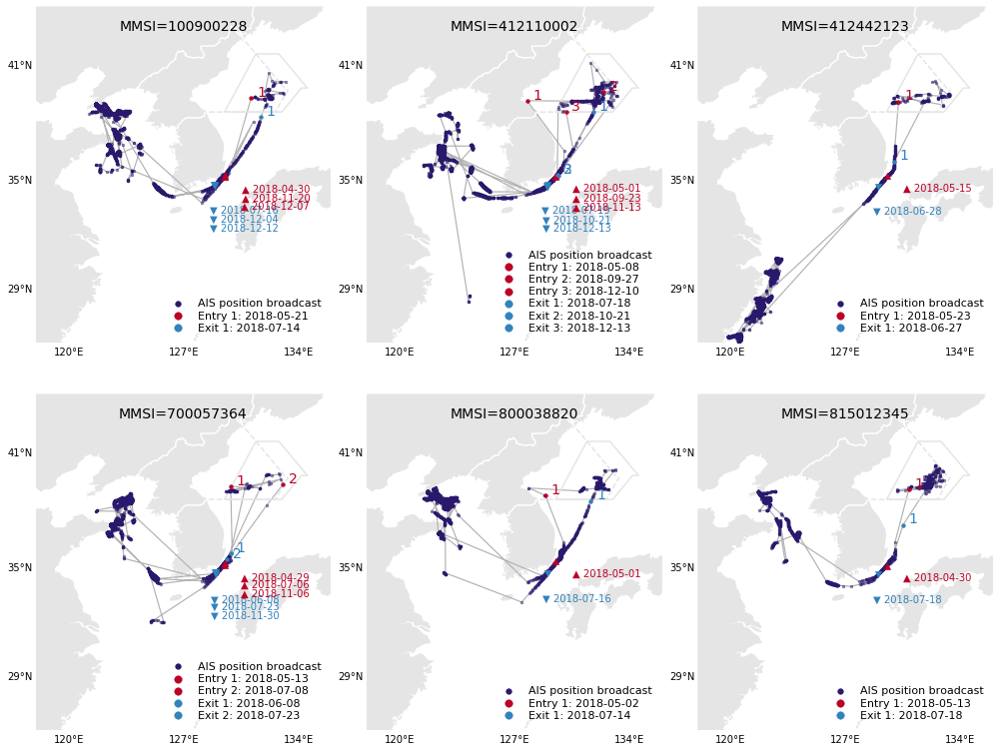

In [107]:
#
# Plot the selected vessel tracks for demonstration
#
multitrack = track2018[(track2018['mmsi']==100900228)|(track2018['mmsi']==412110002)|(track2018['mmsi']==412442123)|
                      (track2018['mmsi']==700057364)|(track2018['mmsi']==800038820)|(track2018['mmsi']==815012345)]
vessel_track_individual_multi(multitrack, '2018-01-01', '2018-12-31', 
                              title='AIS position track in 2018, MMSI={}'.format(1))

## Fig. S17 - Example pair trawler track in detail

In [108]:
q = """
SELECT lat, lon, ssvid, timestamp
FROM `global-fishing-watch.paper_dark_fishing_fleets_in_north_korea.ais_positions_2018`
WHERE timestamp BETWEEN TIMESTAMP('2018-06-01') and TIMESTAMP('2018-06-03')
  AND (ssvid='800038287' OR ssvid='800038289')
ORDER BY timestamp"""
df = pd.read_gbq(q, project_id='global-fishing-watch', dialect='standard')

In [109]:
df['time'] = df['timestamp'].apply(lambda x: x.time())

/anaconda3/envs/py37/lib/python3.7/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


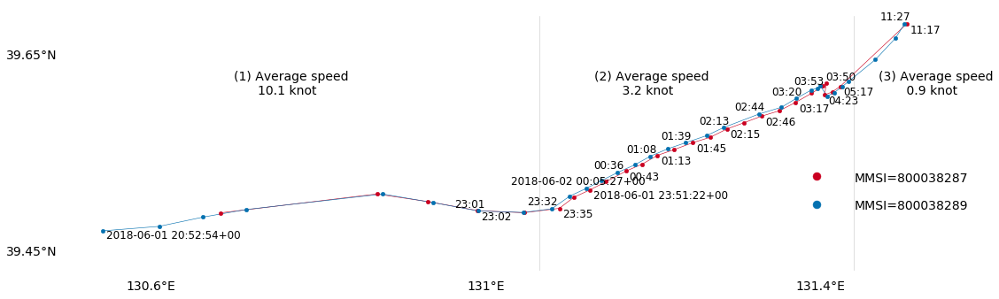

In [110]:
df_fig3d = df.copy()
fig = plt.figure(figsize=(16,6))

llcrnrlon = 130.5
urcrnrlon = 131.6
llcrnrlat = 39.43
urcrnrlat = 39.7

#
# default Basemap setting
ax = fig.add_subplot(111)
m = Basemap(llcrnrlon=llcrnrlon, llcrnrlat=llcrnrlat,
            urcrnrlon=urcrnrlon, urcrnrlat=urcrnrlat, 
            lat_ts=0, projection='mill',resolution="l")
m.drawmapboundary(fill_color='white', color='white', zorder=0.5)

#
# set longitude, latitude ticks on x- and y-axes
gap_lat = 0.2
gap_lon = 0.4
med_lat = 39.45
med_lon = 131
num_tick_lat = 3
num_tick_lon = 3
m.drawmeridians(np.arange(med_lon - gap_lon * (np.ceil(num_tick_lon/2)), 
                          med_lon + gap_lon * np.ceil(num_tick_lon/2.0), gap_lon),
                fontsize=14, labels=[0,0,0,1], linewidth=0.01, zorder=0)
m.drawparallels([39.45, 39.65], fontsize=14, labels=[1,0,0,0], linewidth=0.01, zorder=0)

#
# Plot basic positions and path
df1 = df_fig3d[(df_fig3d['ssvid']=='800038287')]
df1.ix[18, 'time'] = df1['timestamp'].iloc[6]
df2 = df_fig3d[(df_fig3d['ssvid']=='800038289')]
df2.ix[17, 'time'] = df2['timestamp'].iloc[6]
df4 = df_fig3d[(df_fig3d['ssvid']=='800038287')]
df5 = df_fig3d[(df_fig3d['ssvid']=='800038289')]
lon1, lat1 = m(df1['lon'].values, df1['lat'].values)
lon2, lat2 = m(df2['lon'].values, df2['lat'].values)
lon4, lat4 = m(df4['lon'].values, df4['lat'].values)
lon5, lat5 = m(df5['lon'].values, df5['lat'].values)
m.scatter(lon1, lat1, c='#ca0020', s=20, alpha=1,
          edgecolors='face', zorder=2, label='MMSI=800038287')
m.scatter(lon2, lat2, c='#0571b0', s=20, alpha=1,
          edgecolors='face', zorder=2, label='MMSI=800038289')
m.plot(lon4, lat4, c='#ca0020', linewidth=0.6, zorder=1) 
m.plot(lon5, lat5, c='#0571b0', linewidth=0.6, zorder=1) 

lon6, lat6 = m(np.array([131.065,131.065]), np.array([39.4,39.69]))
m.plot(lon6, lat6, c='#969696', linewidth=0.6, alpha=0.5, zorder=1) 
lon7, lat7 = m(np.array([131.44,131.44]), np.array([39.4,39.69]))
m.plot(lon7, lat7, c='#969696', linewidth=0.6, alpha=0.5, zorder=1) 

texts=[]
for n in range(len(df1)):
    if n==21:
        lon1, lat1 = m(df1.iloc[n]['lon']+0.003, df1.iloc[n]['lat']+0.006)
        plt.text(lon1, lat1, str(df1.iloc[n]['time'])[:-3], color='black', fontsize=12 )
    elif (n>1)&(n<26)&(n%2==1):
        lon1, lat1 = m(df1.iloc[n]['lon']+0.004, df1.iloc[n]['lat']-0.009)
        plt.text(lon1, lat1, str(df1.iloc[n]['time'])[:-3], color='black', fontsize=12 )
    elif(n==len(df1)-1):
        lon1, lat1 = m(df1.iloc[n]['lon']+0.004, df1.iloc[n]['lat']-0.009)
        texts.append(plt.text(lon1, lat1, str(df1.iloc[n]['time'])[:-3], color='black', fontsize=12 ))
        
for n in range(len(df2)):
    if (n==10):
        lon2, lat2 = m(df2.iloc[n]['lon']-0.09, df2.iloc[n]['lat']+0.004)
        plt.text(lon2, lat2, str(df2.iloc[n]['timestamp'])[:-3], color='black', fontsize=12 )
    elif (n==0):
        lon2, lat2 = m(df2.iloc[n]['lon']+0.004, df2.iloc[n]['lat']-0.008)
        plt.text(lon2, lat2, str(df2.iloc[n]['timestamp'])[:-3], color='black', fontsize=12 )
    elif ((n>4)&(n<19)&(n%2==0))|(n>30):
        lon2, lat2 = m(df2.iloc[n]['lon']-0.029, df2.iloc[n]['lat']+0.004)
        plt.text(lon2, lat2, str(df2.iloc[n]['time'])[:-3], color='black', fontsize=12 )
    elif ((n>=19)&(n<24)&(n%2==1)):
        lon2, lat2 = m(df2.iloc[n]['lon']-0.029, df2.iloc[n]['lat']+0.004)
        texts.append(plt.text(lon2, lat2, str(df2.iloc[n]['time'])[:-3], color='black', fontsize=12 ))

#
# Annotations
n1x, n1y = m(130.7,39.61)
plt.text(n1x, n1y, '(1) Average speed\n      10.1 knot', fontsize=14)
n2x, n2y = m(131.13,39.61)
plt.text(n2x, n2y, '(2) Average speed\n       3.2 knot', fontsize=14)
n3x, n3y = m(131.47,39.61)
plt.text(n3x, n3y, '(3) Average speed\n       0.9 knot', fontsize=14)
    

#
# Label and legend handling
handles, labels = plt.gca().get_legend_handles_labels()
leg = plt.legend(handles, labels, bbox_to_anchor=(1.0, 0.15), loc=4 ,
                   frameon=False, markerscale=2, fontsize=24)

for text in leg.get_texts():
    text.set_color("black")
    text.set_fontsize(14)
for lh in leg.legendHandles: 
    lh.set_alpha(1)
                    
#
# axes, figures, labels, title
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
            
fig.tight_layout()
plt.show()